In [1]:
import sys
import librosa
import matplotlib.pyplot as plt
import librosa.display
import IPython.display as ipd
import os
import tensorflow as tf
import numpy as np

assets/sounds.wav


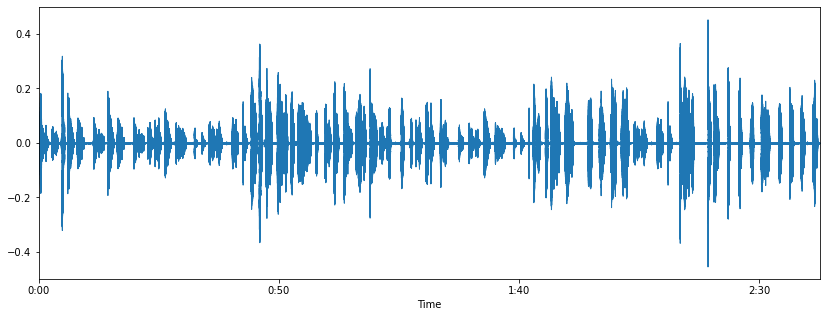

In [5]:
path = "assets/"

files = os.listdir(path)

filename = path + files[0] # pick a file from your assets directory

print(filename)

x, sr = librosa.load(filename) # will default to 22050 unless you specify default=None

plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

In [6]:
data_tf = tf.convert_to_tensor(x, np.float32)
data_tf.shape

TensorShape([3586190])

In [7]:
n = tf.signal.stft(data_tf,2048,512)

In [9]:
magnitude_spectrograms = tf.abs(n)

In [10]:
#we need to get all the fft frames and organise them into sequence batches
start = 0
sequence_length = 40
end = magnitude_spectrograms.shape[0] - sequence_length - 1
step = 1
x_frames = []
y_frames = []
for i in range(start, end, step):
    done = int(float(i) / float(end) * 100.0)
    sys.stdout.write('{}% data generation complete.   \r'.format(done))
    sys.stdout.flush()
    x = magnitude_spectrograms[i:i+sequence_length]
    y = magnitude_spectrograms[i+4]
    x_frames.append(x)
    y_frames.append(y)
x_frames = np.array(x_frames)
y_frames = np.array(y_frames)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [11]:
learning_rate        = 0.001
amount_epochs        = 300
batch_size           = 64
loss_type            = "mse"
weight_decay         = 0.0001



# Recurrent Neural Network
rnn_type             = "lstm"
number_rnn_layers    = 2
rnn_number_units     = 128
model = tf.keras.Sequential()

model.add(tf.keras.layers.BatchNormalization(input_shape=[x_frames.shape[1], x_frames.shape[2]]))

for layer in range(number_rnn_layers):
    return_sequence = False if layer == (number_rnn_layers - 1) else True
    model.add(tf.keras.layers.LSTM(rnn_number_units, return_sequences= return_sequence))
    
model.add(tf.keras.layers.Dense(y_frames.shape[1]))

model.add(tf.keras.layers.Activation('linear'))
opt = tf.keras.optimizers.Adam(learning_rate)
model.compile(optimizer=opt, loss=loss_type)

# this model trains much much faster than the prior models 

In [ ]:
    model.fit(x_frames, y_frames, batch_size=batch_size, epochs=amount_epochs)

Epoch 1/300
109/109 [==============================] - 1s 7ms/step - loss: 0.5408
Epoch 2/300
109/109 [==============================] - 1s 7ms/step - loss: 0.4879
Epoch 3/300
109/109 [==============================] - 1s 7ms/step - loss: 0.4381
Epoch 4/300
109/109 [==============================] - 1s 7ms/step - loss: 0.3955
Epoch 5/300
109/109 [==============================] - 1s 7ms/step - loss: 0.3558
Epoch 6/300
109/109 [==============================] - 1s 7ms/step - loss: 0.3267
Epoch 7/300
109/109 [==============================] - 1s 7ms/step - loss: 0.2966
Epoch 8/300
109/109 [==============================] - 1s 7ms/step - loss: 0.2698
Epoch 9/300
109/109 [==============================] - 1s 7ms/step - loss: 0.2490
Epoch 10/300
109/109 [==============================] - 1s 7ms/step - loss: 0.2283
Epoch 11/300
109/109 [==============================] - 1s 7ms/step - loss: 0.2131
Epoch 12/300
109/109 [==============================] - 1s 7ms/step - loss: 0.2005
Epoch 13/300


109/109 [==============================] - 1s 7ms/step - loss: 0.0250
Epoch 100/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0242
Epoch 101/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0264
Epoch 102/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0287
Epoch 103/300
109/109 [==============================] - 1s 8ms/step - loss: 0.0264
Epoch 104/300
109/109 [==============================] - 1s 8ms/step - loss: 0.0270
Epoch 105/300
109/109 [==============================] - 1s 8ms/step - loss: 0.0257
Epoch 106/300
109/109 [==============================] - 1s 11ms/step - loss: 0.0252
Epoch 107/300
109/109 [==============================] - 1s 10ms/step - loss: 0.0232
Epoch 108/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0227
Epoch 109/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0222
Epoch 110/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0217
Epoc

109/109 [==============================] - 1s 7ms/step - loss: 0.0131
Epoch 197/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0135
Epoch 198/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0139
Epoch 199/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0140
Epoch 200/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0135
Epoch 201/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0135
Epoch 202/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0133
Epoch 203/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0132
Epoch 204/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0128
Epoch 205/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0127
Epoch 206/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0128
Epoch 207/300
109/109 [==============================] - 1s 7ms/step - loss: 0.0129
Epoch 

In [54]:
# Save your model
model.save("myModel.h5")

In [9]:
# Load your model
model = tf.keras.models.load_model("myModel.h5")


In [15]:
# OK so everything is working, but each time it generates an output,
# instead of concatenating it with the previous output
# it creates a new array in the audio[] list with the existing output + the new output.
# this is why it's taking so long to generate.
# Also, the standard griffinlim function from librosa is much faster and vastly preferable.

amount_samples      = 1
sequence_length_max = 1000
impulse_scale       = 1.0
random_chance       = 0.01
random_strength     = 1.0
window_size = 1024

dimension1 = x_frames.shape[1]
dimension2 = x_frames.shape[2]
shape = (1, dimension1, dimension2)

audio = []

for i in range(amount_samples):                                                                                                                                   
    
    random_index = np.random.randint(0, (len(x_frames) - 1))                                                                                                                    
    impulse = np.array(x_frames[random_index]) * impulse_scale
    predicted_magnitudes = impulse
    
    for j in range(sequence_length_max):
        prediction = model.predict(impulse.reshape(shape))
        predicted_magnitudes = np.vstack((predicted_magnitudes, prediction))
        impulse = predicted_magnitudes[-sequence_length:]
        
        if (np.random.random_sample() < random_chance) :
            random_index = np.random.randint(0, (len(x_frames) - 1))                                                                                                                    
            impulse = np.array(x_frames[random_index]) * impulse_scale * random_strength
            #predicted_magnitudes = impulse
        
        done = int(float(i * sequence_length_max + j) / float(amount_samples * sequence_length_max) * 100.0) + 1
        sys.stdout.write('{}% audio generation complete.   \r'.format(done))
        sys.stdout.flush()
        
        #predicted_magnitudes = np.array(predicted_magnitudes).reshape(-1, window_size+1) 
        predicted_magnitudes = np.array(predicted_magnitudes).reshape(-1, window_size+1)                                                                           
        #audio += [librosa.griffinlim(predicted_magnitudes.T)]
        #audio+=[predicted_magnitudes.T]
audio = [librosa.griffinlim(predicted_magnitudes.T)]
audio = np.array(audio)

In [16]:
i = 0

Audio(audio[0], rate=sr)